
## Import pyActigraphy library + basic libraries


In [1]:
import pyActigraphy

In [2]:
import plotly.graph_objs as go

In [3]:
import pandas as pd
import numpy as np

___


## Import RAW file(s) + specify the lengh of data to read (period = ) 
check https://ghammad.github.io/pyActigraphy/pyActigraphy-SSt-log.html discard data

In [62]:
rawAWD = rawATR = pyActigraphy.io.read_raw_atr('2202.txt', period='9 days')

___

## Raw File - Basic Features

In [63]:
rawAWD.start_time

Timestamp('2015-09-22 00:00:00', freq='T')

In [174]:
rawAWD.frequency # sampling frequency

Timedelta('0 days 00:01:00')

In [175]:
rawAWD.data # first and last lines of first cycle

DATE/TIME
2015-09-22 00:00:00     7805
2015-09-22 00:01:00    11704
2015-09-22 00:02:00     1508
2015-09-22 00:03:00     4071
2015-09-22 00:04:00     6019
                       ...  
2015-09-30 23:56:00      133
2015-09-30 23:57:00     1840
2015-09-30 23:58:00     7771
2015-09-30 23:59:00     6901
2015-10-01 00:00:00    10063
Freq: T, Name: PIM, Length: 12961, dtype: int64

In [66]:
rawAWD.data.index

DatetimeIndex(['2015-09-22 00:00:00', '2015-09-22 00:01:00',
               '2015-09-22 00:02:00', '2015-09-22 00:03:00',
               '2015-09-22 00:04:00', '2015-09-22 00:05:00',
               '2015-09-22 00:06:00', '2015-09-22 00:07:00',
               '2015-09-22 00:08:00', '2015-09-22 00:09:00',
               ...
               '2015-09-30 23:51:00', '2015-09-30 23:52:00',
               '2015-09-30 23:53:00', '2015-09-30 23:54:00',
               '2015-09-30 23:55:00', '2015-09-30 23:56:00',
               '2015-09-30 23:57:00', '2015-09-30 23:58:00',
               '2015-09-30 23:59:00', '2015-10-01 00:00:00'],
              dtype='datetime64[ns]', name='DATE/TIME', length=12961, freq='T')

___

## Header Info

In [67]:
raw = rawAWD

In [68]:
raw.name

'teste'

In [69]:
raw.start_time

Timestamp('2015-09-22 00:00:00', freq='T')

In [70]:
raw.duration()

Timedelta('9 days 00:01:00')

________

## Basic Raw Visualization and computation
rawAWD is a time series. Therefore python time series methods apply

In [71]:
rawAWD.data.sum()

52536859

In [72]:
rawAWD.data.mean()

4053.457217807268

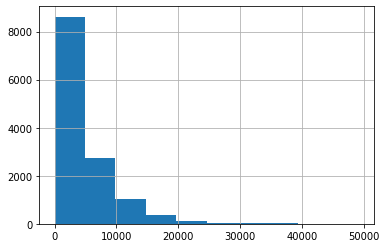

In [73]:
rawAWD.data.hist()

In [218]:
from datetime import datetime
rawAWD.data.idxmax()
Max = rawATR.data.idxmax()
Max = Maximo.strftime("%H:%M:%S")
Max

'18:28:00'

In [219]:
rawAWD.data.idxmin()
Min = rawATR.data.idxmin()
Min = Min.strftime("%H:%M:%S")
Min

'00:16:00'

In [76]:
from plotly.graph_objs import Figure, FigureWidget, Layout, Scatter
from plotly.offline import init_notebook_mode, iplot

init_notebook_mode(connected=True)

In [77]:
layout = Layout(
    title="Raw Actimetry data",
    xaxis=dict(title="Date time"), 
    yaxis=dict(title="Activity/phase"), 
    showlegend=False
)

iplot(Figure(data=[Scatter(x=rawAWD.data.index.astype(str), y=rawAWD.data)], layout=layout))

___

## Sleep-wake cycle inference
pyActigraphy has different methods of sleep inference. Check https://ghammad.github.io/pyActigraphy/pyActigraphy-Sleep-Algorithms.html for details

In [78]:
CK = rawAWD.CK()

In [79]:
np.savetxt("CK.csv", CK, delimiter=",") # to save the cole-kripke output to file

In [80]:
layout = go.Layout(title="Rest/Activity detection",xaxis=dict(title="Date time"), yaxis=dict(title="Counts/period"), showlegend=False)

In [81]:
layout.update(yaxis2=dict(title='Classification',overlaying='y',side='right'), showlegend=True);

In [82]:
go.Figure(data=[
    go.Scatter(x=rawAWD.data.index.astype(str),y=rawAWD.data, name='Data'),
    go.Scatter(x=CK.index.astype(str),y=CK, yaxis='y2', name='CK')
], layout=layout)

In [177]:
roenneberg = rawAWD.Roenneberg()
roenneberg_thr = rawAWD.Roenneberg(threshold=0.25, min_seed_period='30min')

In [83]:
crespo = rawAWD.Crespo()

In [180]:
go.Figure(data=[
    go.Scatter(x=rawAWD.data.index.astype(str),y=rawAWD.data, name='Data'),
    #go.Scatter(x=crespo.index.astype(str),y=crespo, yaxis='y2', name='Crespo'),
    #go.Scatter(x=roenneberg.index.astype(str),y=roenneberg, yaxis='y2', name='Roenneberg'),
    go.Scatter(x=roenneberg_thr.index.astype(str),y=roenneberg_thr, yaxis='y2', name='Roenneberg (Thr:0.25)')
], layout=layout)

In [181]:
aot = raw.Roenneberg_AoT(threshold=0.25, min_seed_period='30min')

In [182]:
aot

(DatetimeIndex(['2015-09-22 06:06:00', '2015-09-23 07:27:00',
                '2015-09-24 08:26:00', '2015-09-25 07:54:00',
                '2015-09-26 08:36:00', '2015-09-27 08:02:00',
                '2015-09-28 06:34:00', '2015-09-29 07:53:00',
                '2015-09-30 08:37:00'],
               dtype='datetime64[ns]', name='DATE/TIME', freq=None),
 DatetimeIndex(['2015-09-22 00:24:00', '2015-09-23 00:40:00',
                '2015-09-24 00:33:00', '2015-09-25 01:00:00',
                '2015-09-26 01:02:00', '2015-09-26 23:26:00',
                '2015-09-28 00:27:00', '2015-09-29 00:50:00',
                '2015-09-30 01:37:00'],
               dtype='datetime64[ns]', name='DATE/TIME', freq=None))

In [184]:
aot[0]-aot[1] # Whant to know the sleep duration for each cycle?

TimedeltaIndex(['05:42:00', '06:47:00', '07:53:00', '06:54:00', '07:34:00',
                '08:36:00', '06:07:00', '07:03:00', '07:00:00'],
               dtype='timedelta64[ns]', name='DATE/TIME', freq=None)

In [222]:
rawAWD.sleep_durations(duration_min='5h', algo='Roenneberg') # easier way to retrieve sleep bouts

[Timedelta('0 days 05:42:00'),
 Timedelta('0 days 06:12:00'),
 Timedelta('0 days 07:53:00'),
 Timedelta('0 days 06:31:00'),
 Timedelta('0 days 06:44:00'),
 Timedelta('0 days 08:36:00'),
 Timedelta('0 days 06:06:00'),
 Timedelta('0 days 07:02:00'),
 Timedelta('0 days 07:00:00')]

___

## Activity Onset and Offset

In [85]:
A_Onset = rawAWD.AonT(freq='10min', binarize=True)
A_Onset

Timedelta('0 days 07:00:00')

In [86]:
A_Offset = rawAWD.AoffT(freq='10min', binarize=True)
A_Offset

Timedelta('0 days 02:00:00')

___

## Basic Non-Parametric Variables

In [87]:
rawAWD.IS()

0.9404880586181967

In [88]:
rawAWD.IS(freq='30min', binarize=True, threshold=4)

0.8861239709910952

In [89]:
rawAWD.IS(freq='1H', binarize=False)

0.6783778974633768

In [90]:
rawAWD.IVm()

0.22320597531891678

In [91]:
rawAWD.IV(freq='1H', binarize=False)

0.7464957797125976

In [92]:
rawAWD.IVm()

0.22320597531891678

In [93]:
rawAWD.IV()

0.27925699436101575

In [94]:
rawAWD.IV(freq='1H', binarize=False)

0.7464957797125976

In [95]:
rawAWD.RA()

0.7141471301535977

In [96]:
rawAWD.RA(binarize=False)

0.9586232465572755

In [97]:
rawAWD.M10()

0.9816666666666771

In [98]:
rawAWD.L5()

0.16370370370370532

___

## Specific Light non-parametric variables: M16 and M3 (dependencies: _lmx, average_daily_activity)

Use this code to specify any phase 

Used when light exposition data is loaded, instead of rest-activity data. M16 and M3

In [99]:
def _lmx(data, period, lowest=True):
    """Calculate the start time and mean activity of the period of
    lowest/highest activity"""

    avgdaily = _average_daily_activity(data, cyclic=True)

    n_epochs = int(pd.Timedelta(period)/avgdaily.index.freq)

    mean_activity = avgdaily.rolling(period).sum().shift(-n_epochs+1)

    if lowest:
        t_start = mean_activity.idxmin()
    else:
        t_start = mean_activity.idxmax()

    lmx = mean_activity[t_start]/n_epochs
    return t_start, lmx


In [100]:
def _average_daily_activity(data, cyclic=False):
    """Calculate the average daily activity distribution"""

    avgdaily = data.groupby([
        data.index.hour,
        data.index.minute,
        data.index.second
    ]).mean()

    if cyclic:
        avgdaily = pd.concat([avgdaily, avgdaily])
        index = pd.timedelta_range(
            start='0 day',
            end='2 days',
            freq=data.index.freq,
            closed='left'
        )
    else:
        index = pd.timedelta_range(
            start='0 day',
            end='2 day',
            freq=data.index.freq,
            closed='left'
        )

    avgdaily.index = index

    return avgdaily

In [101]:
def M16(self, binarize=True, threshold=4):
    if binarize is True:
            data = self.binarized_data(threshold)
    else:
            data = self.data

            _, M16 = _lmx(data, '16H', lowest=False)

    return M16



In [102]:
def M3(self, binarize=True, threshold=4):
    if binarize is True:
            data = self.binarized_data(threshold)
    else:
            data = self.data

            _, M16 = _lmx(data, '3H', lowest=False)

    return M16



In [103]:
M16(rawAWD, binarize=False, threshold=4)

5761.534027777775

In [104]:
M3(rawAWD, binarize=False, threshold=4)

7169.301851851847

___

## Non-Parametric phases (Low and Max)

In [105]:
data = rawAWD.data


In [106]:
L_onset = _lmx(data, 30, lowest=True)
L_onset


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning:

divide by zero encountered in double_scalars



(Timedelta('0 days 02:18:00'), inf)

In [107]:
M_onset= _lmx(data, 30, lowest=False)
M_onset

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning:

divide by zero encountered in double_scalars



(Timedelta('1 days 22:48:00'), inf)

___

## Total Sum - Activity 24h profile (observe the frequency, freq= in average daily activity) + Average daily Activity

In [108]:
Average = rawAWD.average_daily_activity(freq='60min', cyclic=False, binarize=True, threshold=4)
Average 
Average_Activity = np.sum(Average, axis=0)
Average_Activity

1061.911111111111

In [109]:
daily_profile = rawAWD.average_daily_activity(freq='60min', cyclic=True, binarize=True, threshold=4)

In [110]:
daily_profile.mean()

44.24629629629629

In [111]:
daily_profile.median()

57.77777777777778

In [112]:
from scipy import ndimage

In [113]:
ndimage.measurements.center_of_mass(daily_profile) # to calculate the center of gravity or centroid (/2 if 60_)

(26.095132465575695,)

In [114]:
ndimage.measurements.center_of_mass(daily_profile.index) # to calculate the center of gravity or centroid (/2 if 60_)

(31.666666666666668,)

In [115]:
daily_profile.sum() # 2x Lux, because of cyclic=True on daily profile calculation

2123.822222222222

In [116]:
daily_profile.idxmax()

Timedelta('0 days 11:00:00')

In [117]:
daily_profile.idxmin()

Timedelta('0 days 02:00:00')

In [118]:
ProfileGTx = daily_profile[daily_profile>40] # have to specify the value (standard: > 1000 counts)

In [119]:
ProfileGTx.sum()

1865.7777777777778

In [120]:
ProfileGTx.mean()

58.30555555555557

In [121]:
ProfileGTx.idxmax()

Timedelta('0 days 11:00:00')

In [122]:
ProfileGTx.idxmin()

Timedelta('0 days 08:00:00')

In [123]:
ProfileGTxindex = ProfileGTx.index[ProfileGTx>40]

In [124]:
ProfileGTxindex 

TimedeltaIndex(['0 days 08:00:00', '0 days 09:00:00', '0 days 10:00:00',
                '0 days 11:00:00', '0 days 12:00:00', '0 days 13:00:00',
                '0 days 14:00:00', '0 days 15:00:00', '0 days 16:00:00',
                '0 days 17:00:00', '0 days 18:00:00', '0 days 19:00:00',
                '0 days 20:00:00', '0 days 21:00:00', '0 days 22:00:00',
                '0 days 23:00:00', '1 days 08:00:00', '1 days 09:00:00',
                '1 days 10:00:00', '1 days 11:00:00', '1 days 12:00:00',
                '1 days 13:00:00', '1 days 14:00:00', '1 days 15:00:00',
                '1 days 16:00:00', '1 days 17:00:00', '1 days 18:00:00',
                '1 days 19:00:00', '1 days 20:00:00', '1 days 21:00:00',
                '1 days 22:00:00', '1 days 23:00:00'],
               dtype='timedelta64[ns]', freq=None)

___

#### Average 24-h profile View (single or double plot, according to cyclic argument in daily_profile)

In [125]:
layout.update(title="24-h profile - Double plot",xaxis=dict(title="Time"), showlegend=False);


In [126]:
go.Figure(data=[
    go.Scatter(x=daily_profile.index.astype(str), y=daily_profile)
], layout=layout)

___

## Total Counts (PyActigraphy Methods)

In [128]:
rawAWD.ADAT(binarize=True, threshold=4)

958.9

In [227]:
rawAWD.ADATp(period= '9D', binarize=True, threshold=4, verbose=True)

Number of periods: 1
 Time unaccounted for: 0 days, 0h, 0m, 0s


[958.9]

___

## Area Under the Curve (AUC) - 24-h Profile - Total

In [130]:
daily_profile1 = rawAWD.average_daily_activity(freq='60min', cyclic=True, binarize=True, threshold=4)
AUC_total = (np.trapz(daily_profile1, axis=0)/2)
AUC_total

1040.2388888888888

___

## Area Under the Curve (AUC) - 24-h Profile - Partial (View + Calculation)

### 1. According to Sleep-wake cycle - set-up needed

In [131]:
Soff = 5 # example

In [153]:
Son = 22 # example

In [154]:
Soff2 = 29 # example, to compute sleep duration

In [155]:
df = pd.DataFrame(np.array(daily_profile), columns=['y'])
AUC_wake = np.trapz(df['y'][Soff:Son])
AUC_Sleep = np.trapz(df['y'][Son:Soff2])

In [156]:
AUC_wake

843.3333333333333

In [157]:
AUC_Sleep

147.35555555555555

In [158]:
from plotly.subplots import make_subplots
from plotly.graph_objs import Figure, FigureWidget, Layout, Scatter
from plotly.offline import init_notebook_mode, iplot
layout.update(title="Partial Activity profile - Wake",xaxis=dict(title="Time"), showlegend=False);


init_notebook_mode(connected=True)

In [159]:
go.Figure(data=[
    go.Scatter(x=daily_profile.index.astype(str), y = (df['y'][Soff:Son]))
], layout=layout)

In [160]:
layout.update(title="Partial Activity profile - Sleep",xaxis=dict(title="Time"), showlegend=False);

In [161]:
go.Figure(data=[
    go.Scatter(x=daily_profile.index.astype(str), y = (df['y'][Son:Soff2]))
], layout=layout)

### 2. According to natural LD Cycle (check Lat x Long data: https://www.timeanddate.com/)

In [162]:
daily_profile_luz = rawAWD.average_daily_activity(freq='60min', cyclic=True, binarize=True, threshold=4)

In [163]:
Lon = 6 # example of natural LD, sunrise = 6h, sunset = 18h

In [164]:
Loff = 18

In [165]:
Lon2 = 30

In [166]:
df2 = pd.DataFrame(np.array(daily_profile_luz), columns=['y'])
AUC_Day = np.trapz(df2['y'][Lon:Loff])
AUC_Night = np.trapz(df2['y'][Loff:Lon2])

In [167]:
AUC_Day

589.3333333333334

In [168]:
AUC_Night

397.41111111111115

In [169]:
from plotly.subplots import make_subplots
from plotly.graph_objs import Figure, FigureWidget, Layout, Scatter
from plotly.offline import init_notebook_mode, iplot
layout.update(title="Partial Activity profile - Day",xaxis=dict(title="Time"), showlegend=False);


init_notebook_mode(connected=True)

In [170]:
go.Figure(data=[
    go.Scatter(x=daily_profile.index.astype(str), y = (df2['y'][Lon:Loff]))

], layout=layout)

In [171]:
layout.update(title="Partial Activity profile - Night",xaxis=dict(title="Time"), showlegend=False);

go.Figure(data=[
    go.Scatter(x=daily_profile.index.astype(str), y = (df2['y'][Loff:Lon2]))

], layout=layout)

### 3. Count Activity from Sunset to Sleep Onset

In [172]:
AUC_Sunset_SleepOnset = np.trapz(df2['y'][Loff:Son])
AUC_Sunset_SleepOnset

178.83333333333334

In [173]:
layout.update(title="Partial Activity profile - Sunset to Sleep Onset",xaxis=dict(title="Time"), showlegend=False);
go.Figure(data=[
    go.Scatter(x=daily_profile.index.astype(str), y = (df2['y'][Loff:Son]))

], layout=layout)

__________

# More advanced methods

## Sleep fragmentation via state transition probability
https://ghammad.github.io/pyActigraphy/pyActigraphy-StateTransitionProb.html for details

In [185]:
raw.kRA(0, start='AoffT', freq='15min')

0.11689459450073737

In [186]:
raw.kAR(0, start='AonT', freq='15min')

0.017509507172714624

In [231]:
layout = go.Layout(title="",xaxis=dict(title=""), showlegend=False)
pRA, pRA_weights = raw.pRA(0, period='8H')
layout.update(title="Rest->Activity transition probability",xaxis=dict(title="Time [min]"), showlegend=False);
go.Figure(data=go.Scatter(x=pRA.index, y=pRA, name='', mode = 'markers'), layout=layout)

## Cosinor Analysis
https://ghammad.github.io/pyActigraphy/pyActigraphy-Cosinor.html for details

In [197]:
from pyActigraphy.analysis import Cosinor

In [198]:
cosinor = Cosinor()

In [203]:
cosinor.fit_initial_params['Period'].value = 1440
cosinor.fit_initial_params['Period'].vary = False

In [204]:
results = cosinor.fit(rawAWD, verbose=True) # Set verbose to True to print the fit output

[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 12961
    # variables        = 3
    chi-square         = 3.1316e+11
    reduced chi-square = 24167184.6
    Akaike info crit   = 220346.561
    Bayesian info crit = 220368.970
[[Variables]]
    Amplitude:  2527.58156 +/- 61.0683207 (2.42%) (init = 50)
    Acrophase:  2.13378764 +/- 0.02416305 (1.13%) (init = 3.141593)
    Period:     1440 (fixed)
    Mesor:      4053.56130 +/- 43.1811074 (1.07%) (init = 50)


In [205]:
best_fit = cosinor.best_fit(rawAWD, results.params)

In [207]:
results.params.valuesdict()

OrderedDict([('Amplitude', 2527.5815595218714),
             ('Acrophase', 2.133787644929709),
             ('Period', 1440),
             ('Mesor', 4053.561300007728)])

In [206]:
go.Figure(
    data=[
        go.Scatter(x=rawAWD.data.index.astype(str),y=rawAWD.data,name='Raw data'),
        go.Scatter(x=best_fit.index.astype(str),y=best_fit,name='Best fit')
    ]
)

______

## Singular spectrum analysis for time series
https://ghammad.github.io/pyActigraphy/pyActigraphy-SSA.html for details

In [187]:
from pyActigraphy.analysis import SSA

In [188]:
mySSA = SSA(raw.data,window_length='24h')

In [191]:
mySSA.trajectory_matrix().shape
mySSA.fit()
x_elem_0 = mySSA.X_elementary(r=0)

In [192]:
trend = mySSA.X_tilde(0)

In [193]:
trend.shape[0] == len(raw.data.index)

True

In [194]:
et12 = mySSA.X_tilde([1,2])
et34 = mySSA.X_tilde([3,4])

In [195]:
layout = go.Layout(
    height=600,
    width=800,
    title="",
    xaxis=dict(title='Date Time'),
    yaxis=dict(title='Count'),
    shapes=[],
    showlegend=True
)

In [196]:
go.Figure(data=[
    go.Scatter(x=raw.data.index,y=raw.data, name='Activity'),
    go.Scatter(x=raw.data.index,y=trend, name='Trend'),
    go.Scatter(x=raw.data.index,y=trend+et12, name='Circadian component'),
    go.Scatter(x=raw.data.index,y=trend+et34, name='Ultradian component')
], layout=layout)

_____

## Sleep regularity index + Fraction of sleep over daytime + sleep fragmentation

In [208]:
SRI = rawAWD.SleepRegularityIndex() #doi.org/10.1038/s41598-017-03171-4
SRI

/opt/anaconda3/lib/python3.7/site-packages/pyActigraphy/sleep/scoring/utils.py:99: RuntimeWarning:

invalid value encountered in greater



84.1010802469136

In [209]:
SMP = rawAWD.SleepMidPoint()
SMP

Timedelta('0 days 04:17:34.775630')

In [210]:
rawAWD.fSoD(start='AonT', period='10h') #Fraction of Sleep over Daytime

0.11259012756516916

In [211]:
rawAWD.fSoD(algo='CK')

0.0018456995201181247

In [212]:
rawAWD.kRA(0, start='AoffT', freq='15min') #Sleep fragmentation https://doi.org/10.5665/sleep.1400

0.11689459450073737

In [213]:
rawAWD.ADAT() #daily_profile.sum() 

958.9